In [1]:
import sys, os 
import numpy as np 
import pandas as pd
from src import utils, plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from matplotlib import rcParams
default_font = 12
fs_title = 16
rcParams["font.family"] = "Arial"
rcParams["savefig.dpi"] = 300
rcParams["axes.spines.top"] = False
rcParams["axes.spines.right"] = False
rcParams["axes.titlelocation"] = "left"
rcParams["axes.titleweight"] = "normal"
rcParams["font.size"] = default_font
trial_type_palette = ['tab:green', 'tab:red', 'tab:cyan', 'tab:orange', 'grey'] #rew #nrew #rew_test #nrew_test #GI

In [547]:
def get_istim_matrix(m):
    colapsed = m.frameselector.assign(category = m.frameselector["trial_type"].map({"rewarded": "A", "non rewarded": "B", "rewarded test": "A", "non rewarded test": "B"}))
    category = ['A', 'B']
    nneurons = m.interp_spks.shape[0]
    id_responses = np.ones((nneurons, 2, 51, 400)) * np.nan
    for ic, cat in enumerate(category):
        for idx in np.arange(1,52):
            a = colapsed.query(f"istim=={idx} & category == '{cat}'")
            ix = idx - 1
            trials = a.trial_no.unique().astype(int) -1
            reps = len(a.trial_no.unique())
            if reps == 0:
                continue
            if reps >= 2:
                avg = m.interp_spks[:,trials,:].mean(1)
                id_responses[:, ic, ix,:] = avg
            else:
                resp = m.interp_spks[:,trials,:]
                id_responses[:, ic, ix,:] = resp.squeeze()
    print(id_responses.shape)
    return id_responses

def filter_neurons(m, area, category, celltype=None):
    try:
        ia = utils.get_region_idx(m.iarea, area)
    except:
        AssertionError("area must be 'V1', 'medial', 'lateral' or 'anterior'")
    if category == "A":
        dp = m.train_dp >= np.percentile(m.train_dp[ia], 95)
    elif category == "B":
        dp = m.train_dp <= np.percentile(m.train_dp[ia], 5)
    else:
        AssertionError("category must be A or B")
    if celltype is not None:
        if celltype == "Pyr":
            selected_type = np.logical_not(m.isred[:,0]).astype(bool)
        elif celltype == "Int":
            selected_type = m.isred[:,0].astype(bool)
        else:
            AssertionError("celltype must be 'Pyr' or 'Int' or None")
        selection = ia * dp * selected_type
        prop = selection.sum() / ia.sum()
    else:
        selection = ia * dp
        prop = selection.sum() / ia.sum()
    return selection, prop

def filter_neurons_v2(m, area, category, celltype=None):
        try:
            ia = utils.get_region_idx(m.iarea, area)
        except:
            AssertionError("area must be 'V1', 'medial', 'lateral' or 'anterior'")
        if celltype is not None:
            if celltype == "Pyr":
                selected_type = np.logical_not(m.isred[:,0]).astype(bool)
            elif celltype == "Int":
                selected_type = m.isred[:,0].astype(bool)
            else:
                AssertionError("celltype must be 'Pyr' or 'Int' or None")
            if category == "A":
                dp = m.train_dp >= np.percentile(m.train_dp[ia*selected_type], 95)
            elif category == "B":
                dp = m.train_dp <= np.percentile(m.train_dp[ia*selected_type], 5)
            else:
                AssertionError("category must be A or B")
            selection = ia * dp * selected_type
            prop = selection.sum() / ia.sum()
        else:
            if category == "A":
                dp = m.train_dp >= np.percentile(m.train_dp[ia], 95)
            elif category == "B":
                dp = m.train_dp <= np.percentile(m.train_dp[ia], 5)
            else:
                AssertionError("category must be A or B")
            selection = ia * dp
            prop = selection.sum() / ia.sum()
        return selection, prop


def get_sim_matrix(m, id_responses, area, category, celltype=None):
    nneurons = id_responses.shape[0]
    id_resp_idx = id_responses.reshape(nneurons, 102, 400)
    from itertools import combinations
    representation_matrix = np.ones((102,102)) * np.nan
    pairs = list(combinations(np.arange(102),2))
    selection, _ = filter_neurons_v2(m, area, category, celltype=celltype)
    id_area = id_resp_idx[selection, :,:].mean(0)
    for pair in pairs:
        instance_a = id_area[pair[0],:]
        instance_b = id_area[pair[1],:]
        corr = np.corrcoef(instance_a, instance_b)[0,1]
        representation_matrix[pair[0],pair[1]] = corr
        representation_matrix[pair[1],pair[0]] = corr
    return representation_matrix

def get_sim_matrix_v2(m, id_responses, area, category, celltype=None):
    nneurons = id_responses.shape[0]
    id_resp_idx = id_responses.reshape(nneurons, 102, 400)
    from itertools import combinations
    representation_matrix = np.ones((102,102)) * np.nan
    pairs = list(combinations(np.arange(102),2))
    selection, _ = filter_neurons_v2(m, area, category, celltype=celltype)
    id_area = id_resp_idx[selection,:,0:125].mean(2)
    for pair in pairs:
        instance_a = id_area[:,pair[0]]
        instance_b = id_area[:,pair[1]]
        corr = np.corrcoef(instance_a, instance_b)[0,1]
        representation_matrix[pair[0],pair[1]] = corr
        representation_matrix[pair[1],pair[0]] = corr
    return representation_matrix

def plot_sim_matrix(ax, representation_matrix):
    sns.heatmap(representation_matrix, cmap='coolwarm', center=0, cbar=False, ax=ax)
    ax.axvline(50.7, color='k', linestyle='--')
    ax.axhline(50.7, color='k', linestyle='--')
    ax.text(-12, 35, 'Category A', fontsize=12, rotation=90)
    ax.text(-12, 85, 'Category B', fontsize=12, rotation=90)
    ax.text(15, -2, 'Category A', fontsize=12)
    ax.text(65, -2, 'Category B', fontsize=12)

def plot_responses_to_instances(ax, m, id_responses, area, category, celltype=None):
    nneurons = id_responses.shape[0]
    id_resp_idx = id_responses.reshape(nneurons, 102, 400)
    selection, _ = filter_neurons_v2(m, area, category, celltype=celltype)
    n = id_resp_idx[selection, :,:].mean(0)
    sns.heatmap(n, cmap='bwr', center=0, cbar_kws={'label': 'estimated FR (Hz) ', 'shrink': 0.5}, ax=ax)
    ax.axhline(50.7, color='k', linestyle='--')
    ax.text(-45, 35, 'Category A', fontsize=12, rotation=90)
    ax.text(-45, 85, 'Category B', fontsize=12, rotation=90)

In [8]:
VG11 = []
VG11.append({'mname': 'VG11', 'datexp': '2024_10_15', 'blk':'4'})
VG11.append({'mname': 'VG11', 'datexp': '2024_10_16', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_10_31', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_11_01', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_11_04', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_11_05', 'blk':'3'})
VG11.append({'mname': 'VG11', 'datexp': '2024_11_14', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_11_15', 'blk':'2'})
VG14 = []
VG14.append({'mname': 'VG14', 'datexp': '2024_10_15', 'blk':'2'})
VG14.append({'mname': 'VG14', 'datexp': '2024_10_16', 'blk':'2'})
VG14.append({'mname': 'VG14', 'datexp': '2024_11_21', 'blk':'2'})
VG14.append({'mname': 'VG14', 'datexp': '2024_11_23', 'blk':'2'})
VG15 = []
VG15.append({'mname': 'VG15', 'datexp': '2024_10_15', 'blk':'3'})
VG15.append({'mname': 'VG15', 'datexp': '2024_10_16', 'blk':'2'})
VG15.append({'mname': 'VG15', 'datexp': '2024_10_31', 'blk':'2'})
VG15.append({'mname': 'VG15', 'datexp': '2024_11_01', 'blk':'3'})
all_sessions = VG11 + VG14 + VG15
all_sessions

[{'mname': 'VG11', 'datexp': '2024_10_15', 'blk': '4'},
 {'mname': 'VG11', 'datexp': '2024_10_16', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_10_31', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_11_01', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_11_04', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_11_05', 'blk': '3'},
 {'mname': 'VG11', 'datexp': '2024_11_14', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_11_15', 'blk': '2'},
 {'mname': 'VG14', 'datexp': '2024_10_15', 'blk': '2'},
 {'mname': 'VG14', 'datexp': '2024_10_16', 'blk': '2'},
 {'mname': 'VG14', 'datexp': '2024_11_21', 'blk': '2'},
 {'mname': 'VG14', 'datexp': '2024_11_23', 'blk': '2'},
 {'mname': 'VG15', 'datexp': '2024_10_15', 'blk': '3'},
 {'mname': 'VG15', 'datexp': '2024_10_16', 'blk': '2'},
 {'mname': 'VG15', 'datexp': '2024_10_31', 'blk': '2'},
 {'mname': 'VG15', 'datexp': '2024_11_01', 'blk': '3'}]

In [ ]:
from pathlib import Path
for sess in all_sessions:
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    m = utils.load_mouse(name, date, blk, load_neurons=True, interp_behav=True, load_retinotopy=True, mdl_path="D:\mouseobj")
    #frameselector = utils.get_frameselector(m)
    #istim_df = pd.DataFrame(m._timeline['istim'], columns=['istim'])
    #istim_df["trial_no"] = np.arange(1, len(istim_df)+1).astype(float)
    #m.frameselector = (frameselector.reset_index()
    #    .rename(columns = {'index':'frame'})
    #    .merge(istim_df, left_on='trial_no', right_on='trial_no', how='left')
    #    .set_index('frame'))
    #utils.save_mouse(m, compressed=False, mdl_path="D:\mouseobj")
    id_responses = get_istim_matrix(m)
    utils.compute_dprime(m, discrimination_region=(25,275), concatenate=True)
    for area in ['V1','anterior', 'medial', 'lateral']:
        for category in ['A', 'B']:
            for celltype in ['Pyr', 'Int']:
                representation_matrix = get_sim_matrix(m, id_responses, area = area, category = category, celltype=celltype)
                fig, ax = plt.subplots(1,2, figsize=(16,6))
                plot_sim_matrix(ax[1], representation_matrix)
                plot_responses_to_instances(ax[0], m, id_responses, area = area, category = category, celltype=celltype)
                plt.suptitle(f"{area} {category} {celltype}")
                plt.savefig(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/similarity_matrix_concat.png"))
                _, prop = filter_neurons(m, area, category, celltype=celltype)
                np.save(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/representation_matrix_concat.npy"), representation_matrix)
                np.save(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/proportion_cells_concat.npy"), prop)

In [71]:
len(all_sessions)

16

In [10]:
from pathlib import Path
overall_mtx = np.empty((16,4,2,2,102,102))
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.load(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/representation_matrix_concat.npy"))
                overall_mtx[iss,ia,ic,icell,:,:] = representation_matrix

C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\1407592018.py:12: RuntimeWarning: Mean of empty slice
  representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)


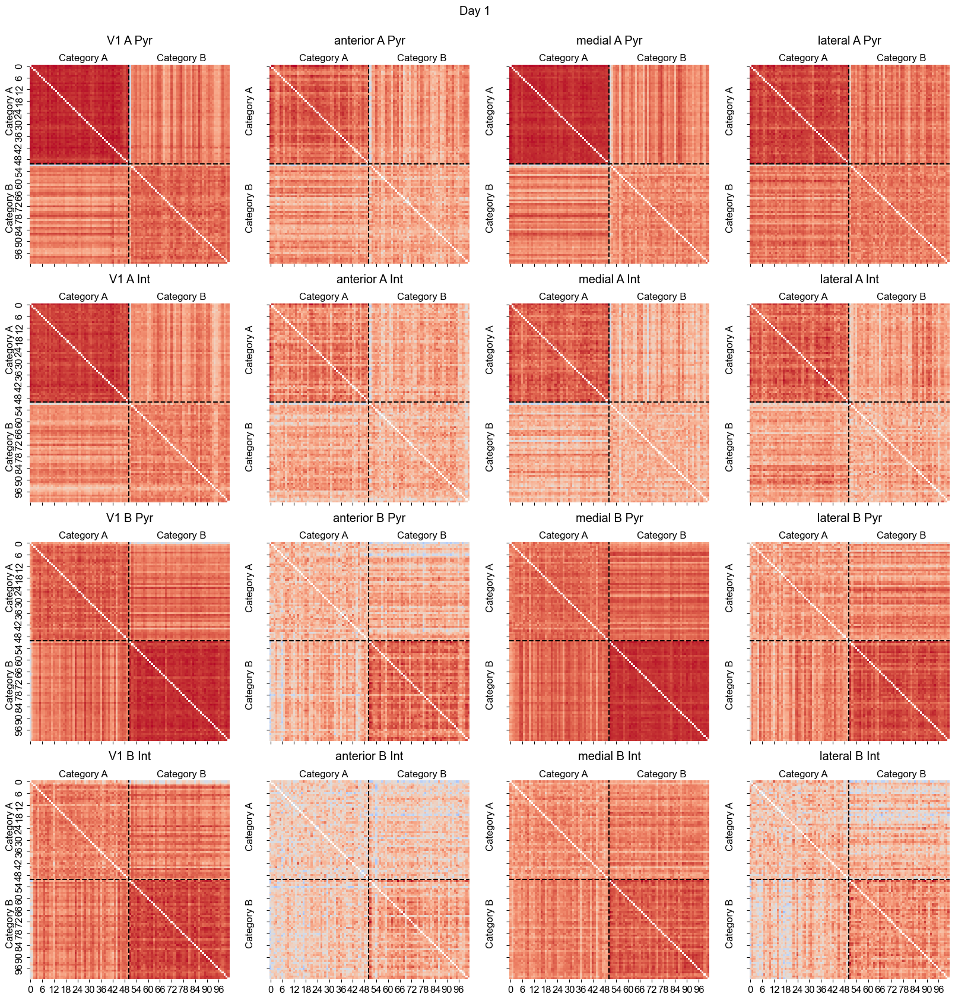

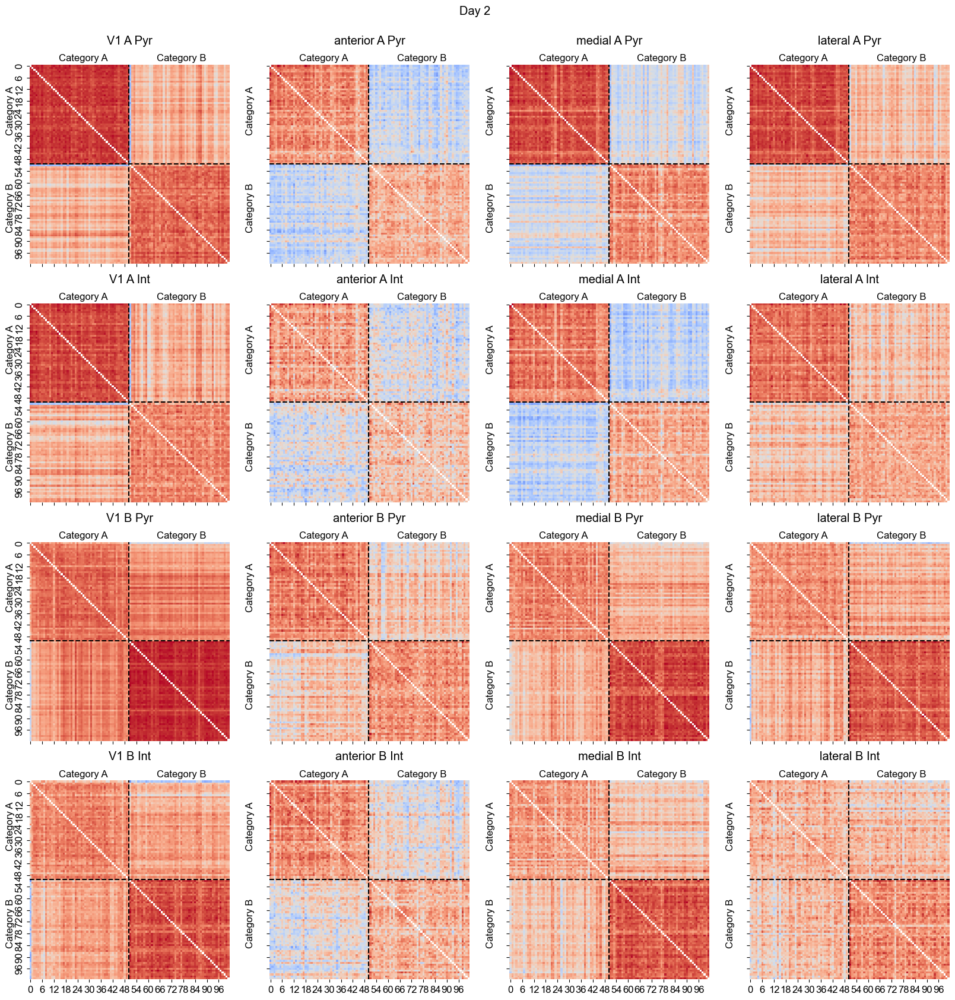

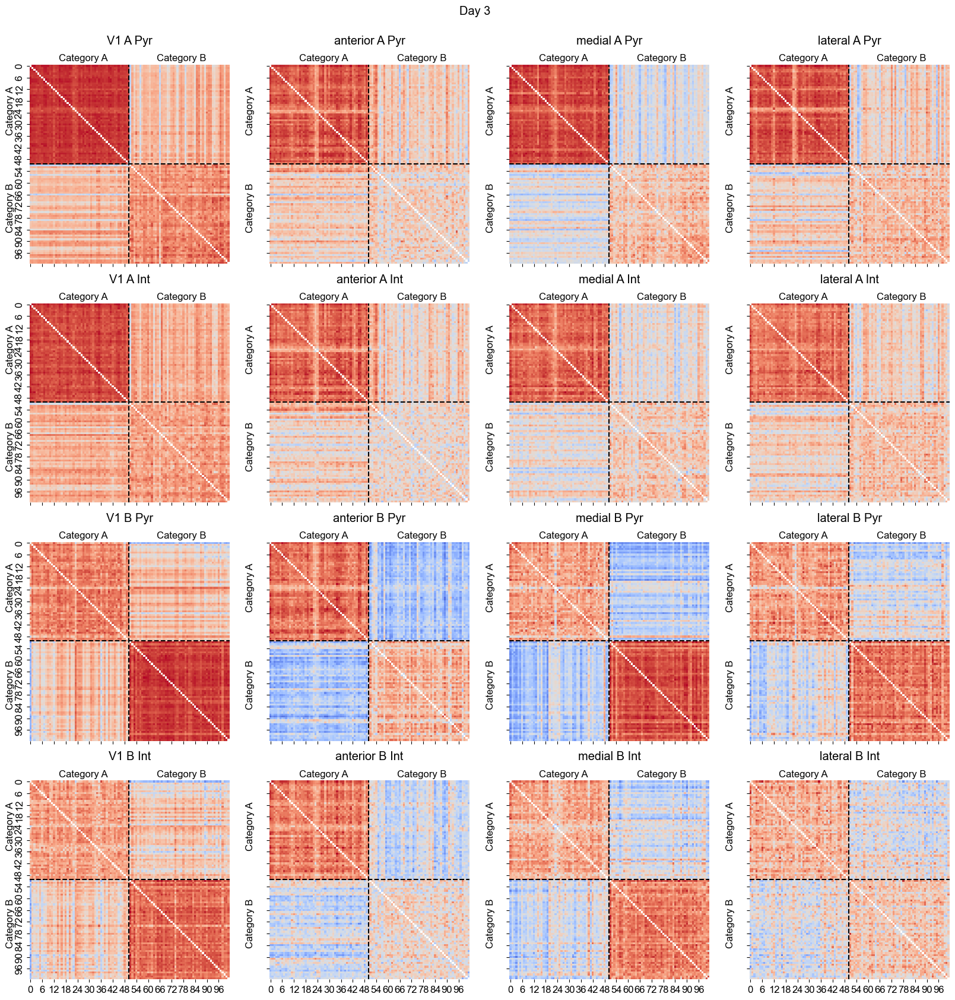

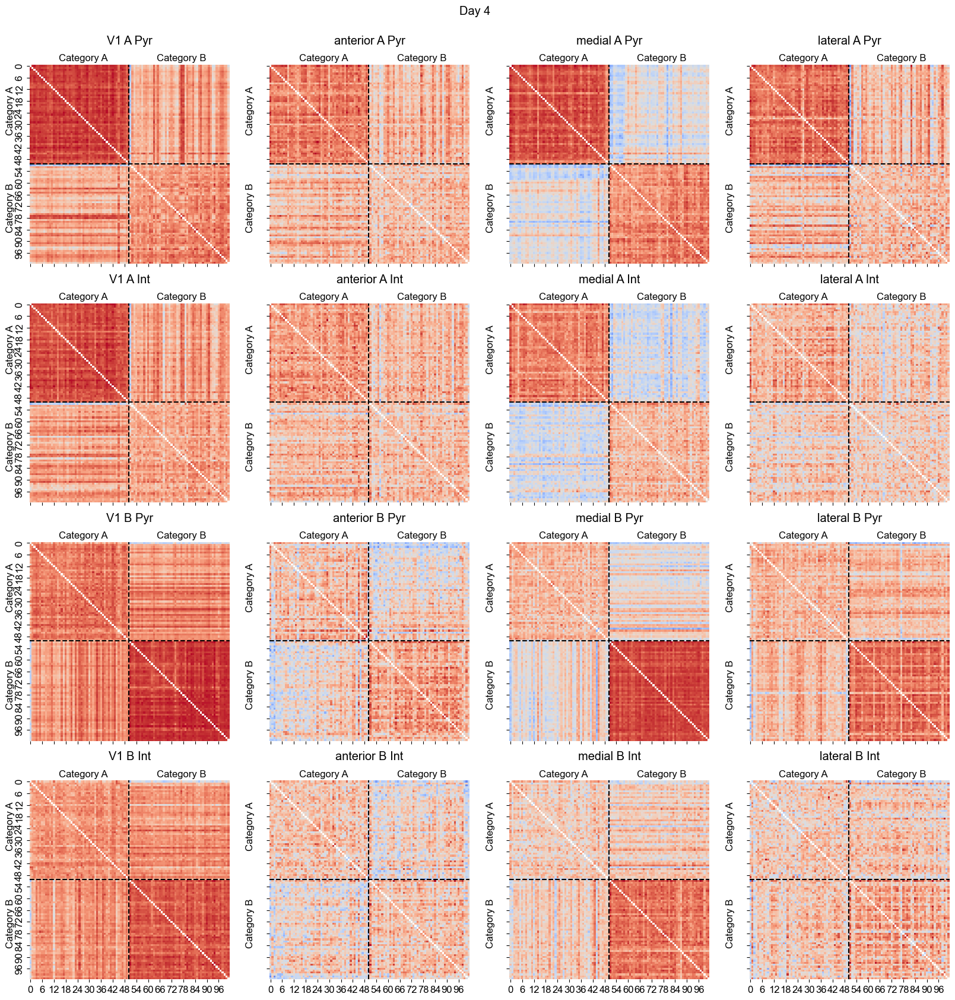

In [11]:
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
sess_days = [first_day, second_day, third_day, fourth_day]
for iday, day in enumerate(sess_days):
    fig, ax = plt.subplots(4,4, figsize=(20,20), sharex=True, sharey=True)
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']): 
        i=0
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)
                np.save(Path(f"../data/overall/{area}/{category}/{celltype}/representation_matrix_{iday+1}_concat.npy"), representation_matrix)
                plot_sim_matrix(ax[i,ia],representation_matrix)
                ax[i,ia].set_title(f"{area} {category} {celltype}", pad=25, loc='center')
                i+=1
    plt.suptitle(f"Day {iday+1}", y=0.93)
    plt.savefig(Path(f"../data/overall/similarity_matrix_day{iday+1}_concat.png"))

In [89]:
VG11 = []
VG11.append({'mname': 'VG11', 'datexp': '2024_10_15', 'blk':'4'})
VG11.append({'mname': 'VG11', 'datexp': '2024_10_16', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_10_31', 'blk':'2'})
VG11.append({'mname': 'VG11', 'datexp': '2024_11_01', 'blk':'2'})
VG15 = []
VG15.append({'mname': 'VG15', 'datexp': '2024_10_15', 'blk':'3'})
VG15.append({'mname': 'VG15', 'datexp': '2024_10_16', 'blk':'2'})
VG15.append({'mname': 'VG15', 'datexp': '2024_10_31', 'blk':'2'})
VG15.append({'mname': 'VG15', 'datexp': '2024_11_01', 'blk':'3'})
samestim = VG11 + VG15
samestim

[{'mname': 'VG11', 'datexp': '2024_10_15', 'blk': '4'},
 {'mname': 'VG11', 'datexp': '2024_10_16', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_10_31', 'blk': '2'},
 {'mname': 'VG11', 'datexp': '2024_11_01', 'blk': '2'},
 {'mname': 'VG15', 'datexp': '2024_10_15', 'blk': '3'},
 {'mname': 'VG15', 'datexp': '2024_10_16', 'blk': '2'},
 {'mname': 'VG15', 'datexp': '2024_10_31', 'blk': '2'},
 {'mname': 'VG15', 'datexp': '2024_11_01', 'blk': '3'}]

In [90]:
from pathlib import Path
overall_mtx_sstim = np.empty((8,4,2,2,102,102))
for iss, sess in enumerate(samestim):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.load(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/representation_matrix.npy"))
                overall_mtx_sstim[iss,ia,ic,icell,:,:] = representation_matrix

In [ ]:
first_day = np.arange(0,8,4)
second_day = np.arange(1,8,4)
third_day = np.arange(2,8,4)
fourth_day = np.arange(3,8,4)
sess_days = [first_day, second_day, third_day, fourth_day]
for iday, day in enumerate(sess_days):
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']): 
        i=0
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.nanmean(overall_mtx_sstim[day,ia,ic,icell,:,:], axis=0)
                np.save(Path(f"../data/overall/{area}/{category}/{celltype}/representation_matrix_{iday+1}_sstim.npy"), representation_matrix)
                #plot_sim_matrix(ax[i,ia],representation_matrix)
                #ax[i,ia].set_title(f"{area} {category} {celltype}", pad=25, loc='center')
                #i+=1
    #plt.suptitle(f"Day {iday+1}", y=0.93)
    #plt.savefig(Path(f"../data/overall/similarity_matrix_day{iday+1}_samestim.png"))

# comparison between the representation sim matrices

In [12]:
overall_sim_mtx = np.empty((4,4,2,2,102,102))
for day in range(4):
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']): 
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                sim_matrix = np.load(Path(f"../data/overall/{area}/{category}/{celltype}/representation_matrix_{day+1}.npy"))
                overall_sim_mtx[day,ia,ic,icell,:,:] = sim_matrix
np.save(Path(f"../data/overall/overall_sim_mtx.npy"), overall_sim_mtx)

In [62]:
GI_df = pd.DataFrame(columns=['day', 'area', 'category', 'celltype', 'GI'])
for day in range(4):
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']): 
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                sim_matrix = np.load(Path(f"../data/overall/{area}/{category}/{celltype}/representation_matrix_{day+1}.npy"))
                cat_A = np.nanmean(overall_sim_mtx[day,ia,ic,icell, :51, :51])
                cat_B = np.nanmean(overall_sim_mtx[day,ia,ic,icell, 51:, 51:])
                intercat = np.mean(overall_sim_mtx[day,ia,ic,icell, :51, 51:])
                GI = np.mean([cat_A,cat_B]) - intercat
                GI_df = GI_df.append({'day': day+1, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)

C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\2961733748.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GI_df = GI_df.append({'day': day+1, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\2961733748.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GI_df = GI_df.append({'day': day+1, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\2961733748.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GI_df = GI_df.append({'day': day+1, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)
C:\Users\l

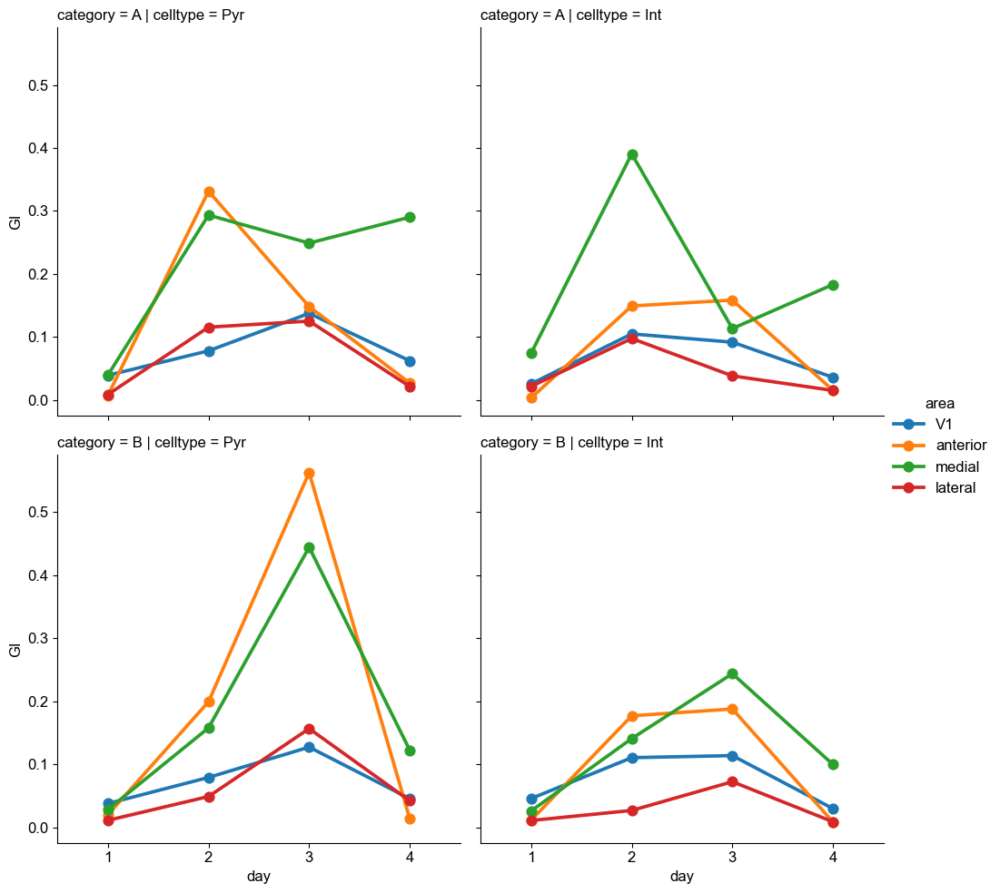

In [66]:
sns.catplot(data=GI_df, x='day', y='GI', hue='area', row = 'category', col='celltype', kind='point', palette='tab10')

In [67]:
from pathlib import Path
overall_mtx = np.empty((16,4,2,2,102,102))
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.load(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/representation_matrix.npy"))
                overall_mtx[iss,ia,ic,icell,:,:] = representation_matrix
np.save(Path(f"../data/overall/overall_mtx_permouse.npy"), overall_mtx)

In [68]:
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1','anterior', 'medial', 'lateral']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                overall_mtx[iss,ia,ic,icell,:,:]
                cat_A = np.nanmean(overall_mtx[iss,ia,ic,icell, :51, :51])
                cat_B = np.nanmean(overall_mtx[iss,ia,ic,icell, 51:, 51:])
                intercat = np.mean(overall_mtx[iss,ia,ic,icell, :51, 51:])
                GI = np.mean([cat_A,cat_B]) - intercat
                if iss in first_day:
                    day = 1
                elif iss in second_day:
                    day = 2
                elif iss in third_day:
                    day = 3
                elif iss in fourth_day:
                    day = 4
                GI_df = GI_df.append({'mouse': name, 'date': date, 'day':day, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)

C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\3331916101.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GI_df = GI_df.append({'mouse': name, 'date': date, 'day':day, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\3331916101.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GI_df = GI_df.append({'mouse': name, 'date': date, 'day':day, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI}, ignore_index=True)
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\3331916101.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GI_df = GI_df.append({'mouse': name, 'date': date, 'day':day, 'area': area, 'categ

In [73]:
# map values of a column to a different set of values
GI_df['day'] = GI_df['day'].map({1: 'all rewarded before', 2: 'first day of training', 3: 'last day of training', 4: 'all rewarded after'})

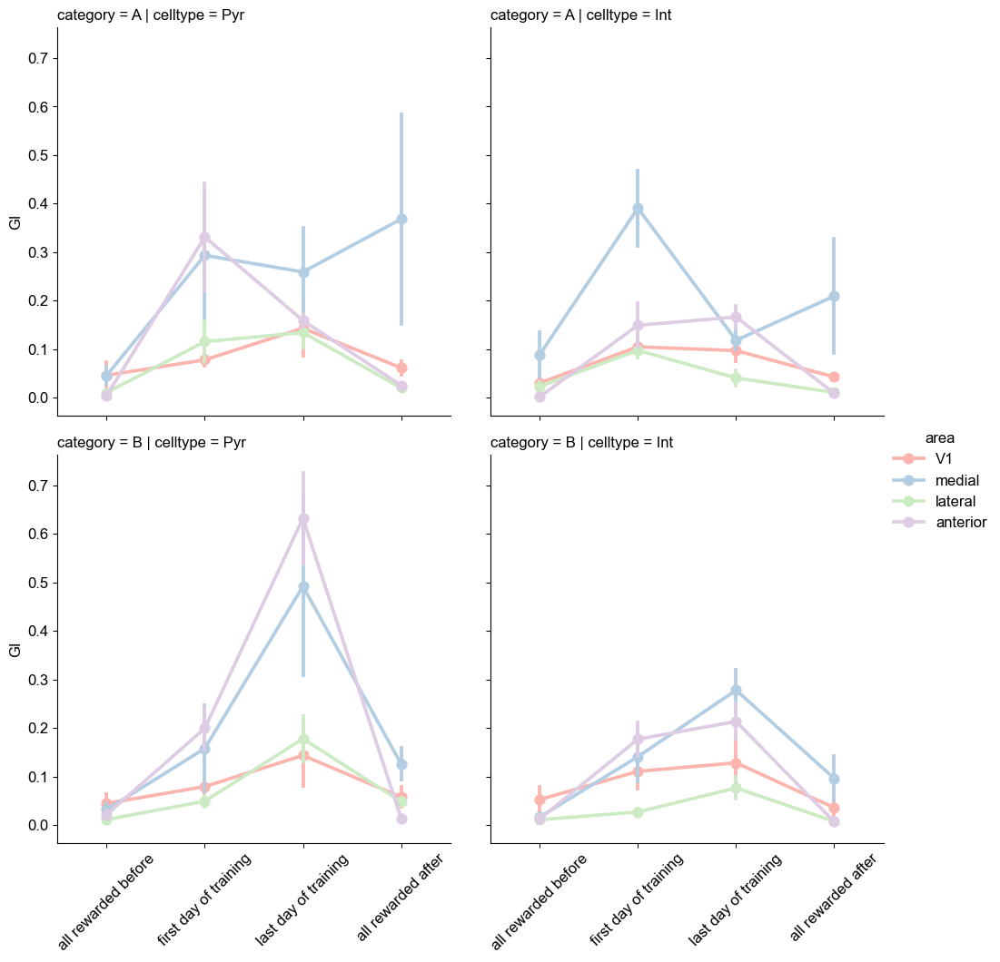

In [77]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='area', row = 'category', col='celltype', kind='point', errorbar='se', palette='Pastel1', hue_order=['V1', 'medial', 'lateral', 'anterior'])
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

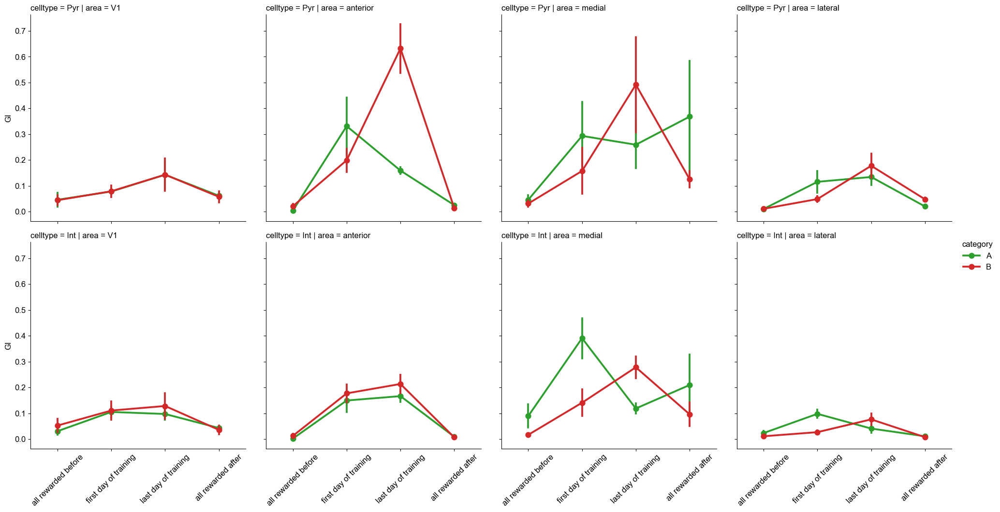

In [ ]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='category', row = 'celltype', col='area', kind='point', errorbar='se', palette=['tab:green','tab:red'], hue_order=['A', 'B'], )
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

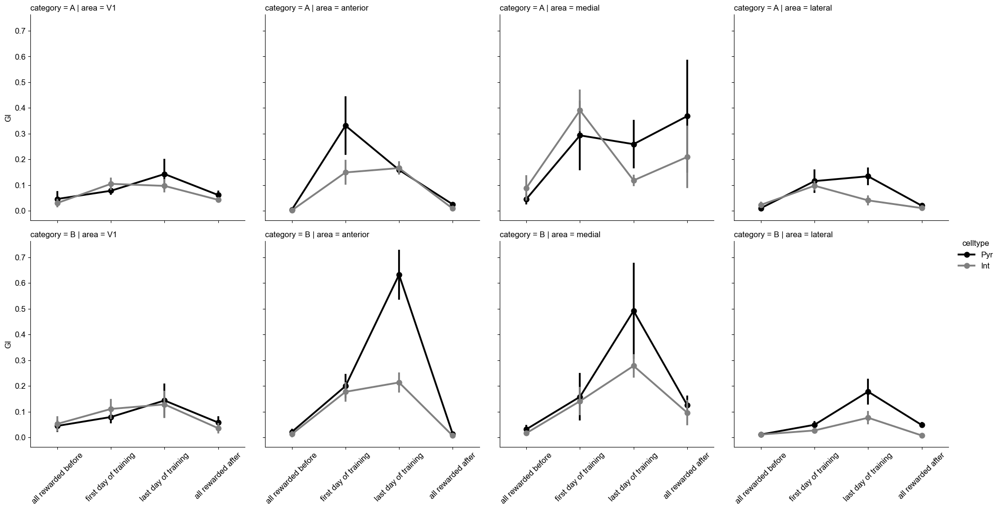

In [82]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='celltype', row = 'category', col='area', kind='point', errorbar='se', palette=['k','gray'], hue_order=['Pyr', 'Int'])
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

# getting models with the interpolated data not zscored

In [145]:
for sess in all_sessions:
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    m = utils.load_mouse(name, date, blk, load_neurons=True, interp_behav=True, load_retinotopy=True, mdl_path="D:\mouseobj")
    m.interp_spks = utils.interp_spks_by_corridorlength(m, m.frameselector, z = False, corridor_length=400)
    utils.save_mouse(m, compressed=False, mdl_path=r"D:\mouseobj\notz") #save mouse obj for later use

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_10_15\4
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
39 11681
interpolating 25932 neurons, 11643 frames to
the vector of distance with shape: (11643,)
neurons: 25932, trials: 345, corridor length: 400
Creating directory D:\mouseobj\notz\VG11\2024_10_15\4
Mouse object saved to D:\mouseobj\notz\VG11\2024_10_15\4
Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_t

# removing th mean of the data, similarity matrix

In [433]:
for sess in all_sessions:
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    m = utils.load_mouse(name, date, blk, load_neurons=True, interp_behav=True, load_retinotopy=True, mdl_path=r"D:\mouseobj\notz")
    m.interp_spks = m.interp_spks - m.interp_spks.mean(1, keepdims=True)
    id_responses = get_istim_matrix(m)
    utils.compute_dprime(m, discrimination_region=(0,125), concatenate=False, remove_mean=False)
    for area in ['V1', 'medial', 'lateral', 'anterior']:
        for category in ['A', 'B']:
            for celltype in ['Pyr', 'Int']:
                main_dir = Path(f"../data/notz/{name}/{date}/{blk}/{area}/{category}/{celltype}")
                if not main_dir.exists():
                    main_dir.mkdir(parents=True)
                representation_matrix = get_sim_matrix_v2(m, id_responses, area = area, category = category, celltype=celltype)
                fig, ax = plt.subplots(1,2, figsize=(16,6))
                plot_sim_matrix(ax[1], representation_matrix)
                plot_responses_to_instances(ax[0], m, id_responses, area = area, category = category, celltype=celltype)
                plt.suptitle(f"{area} {category} {celltype}")
                plt.savefig(Path(f"{main_dir}/similarity_matrix_neun_0_150.png"))
                plt.close()
                np.save(Path(f"{main_dir}/representation_matrix_neun_0_150.npy"), representation_matrix)

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_10_15\4
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(25932, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials
Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(29324, 2, 51, 400)
dprime saved in Mouse

In [3]:
from pathlib import Path
overall_mtx = np.empty((16,4,2,2,102,102))
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.load(Path(f"../data/notz/{name}/{date}/{blk}/{area}/{category}/{celltype}/representation_matrix_neun_0_150.npy"))
                overall_mtx[iss,ia,ic,icell,:,:] = representation_matrix
np.save(Path(f"../data/notz/overall/overall_mtx_permouse_neun_0_150.npy"), overall_mtx)

NameError: name 'all_sessions' is not defined

In [4]:
overall_mtx = np.load(Path(f"../data/notz/overall/overall_mtx_permouse_neun_0_150.npy"))

In [5]:
overall_mtx.shape

(16, 4, 2, 2, 102, 102)

C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\4063135253.py:12: RuntimeWarning: Mean of empty slice
  representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)


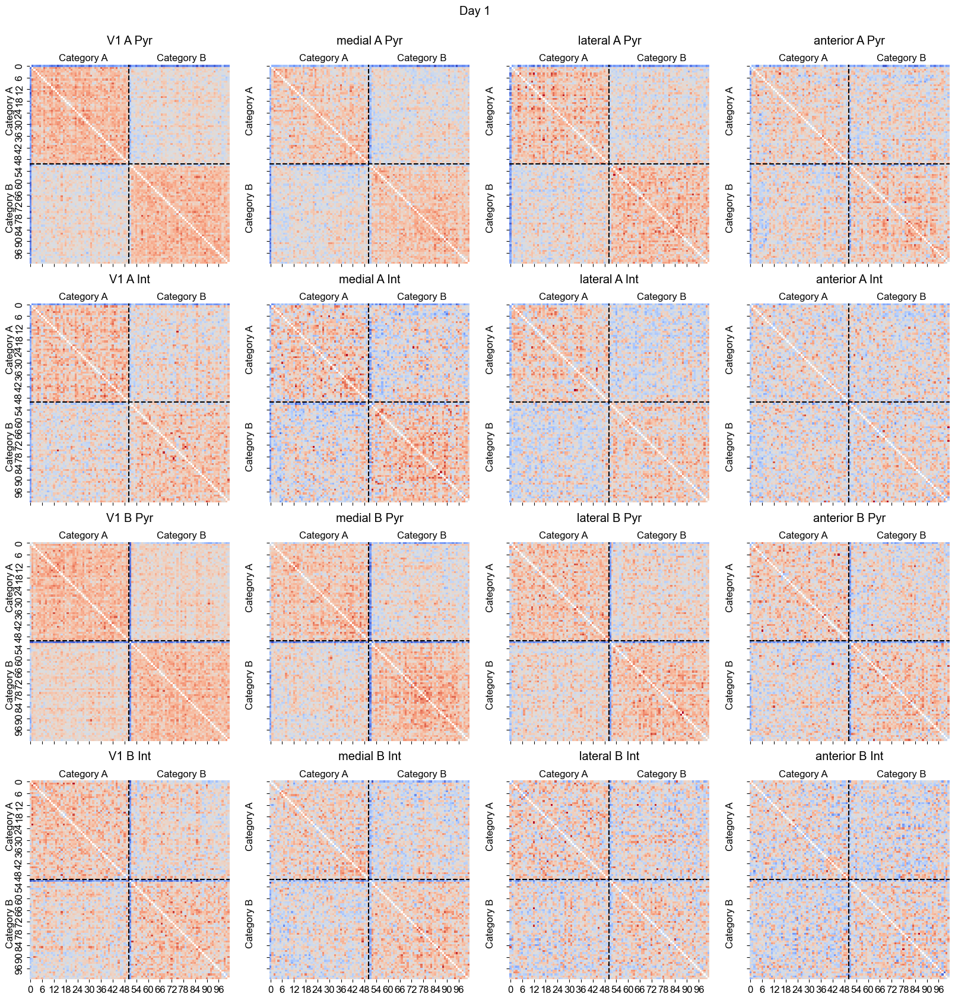

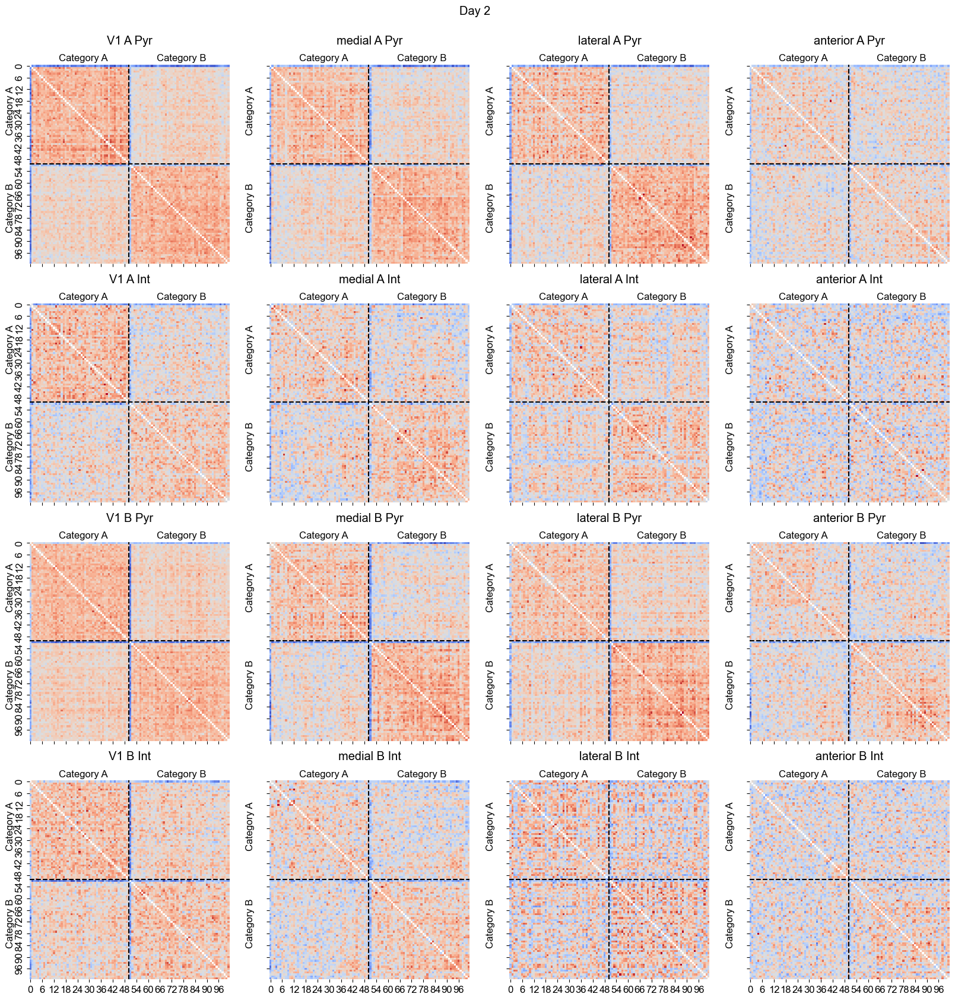

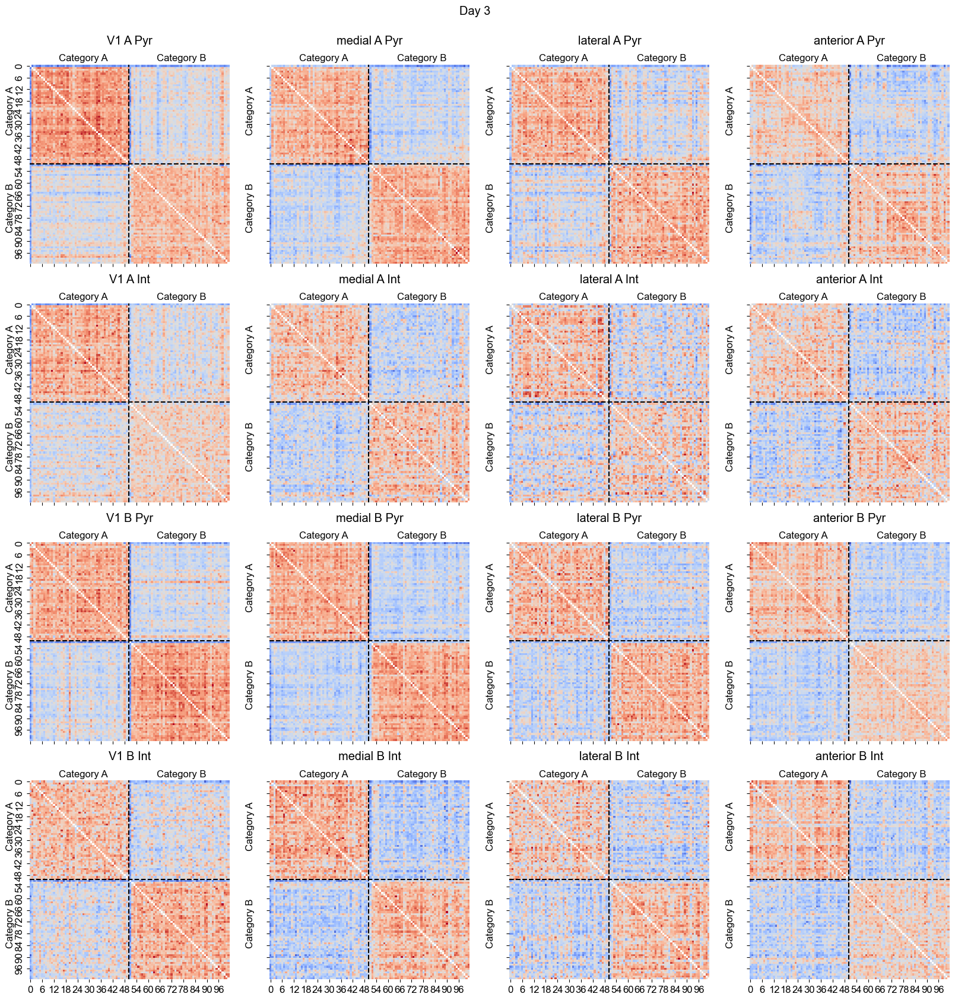

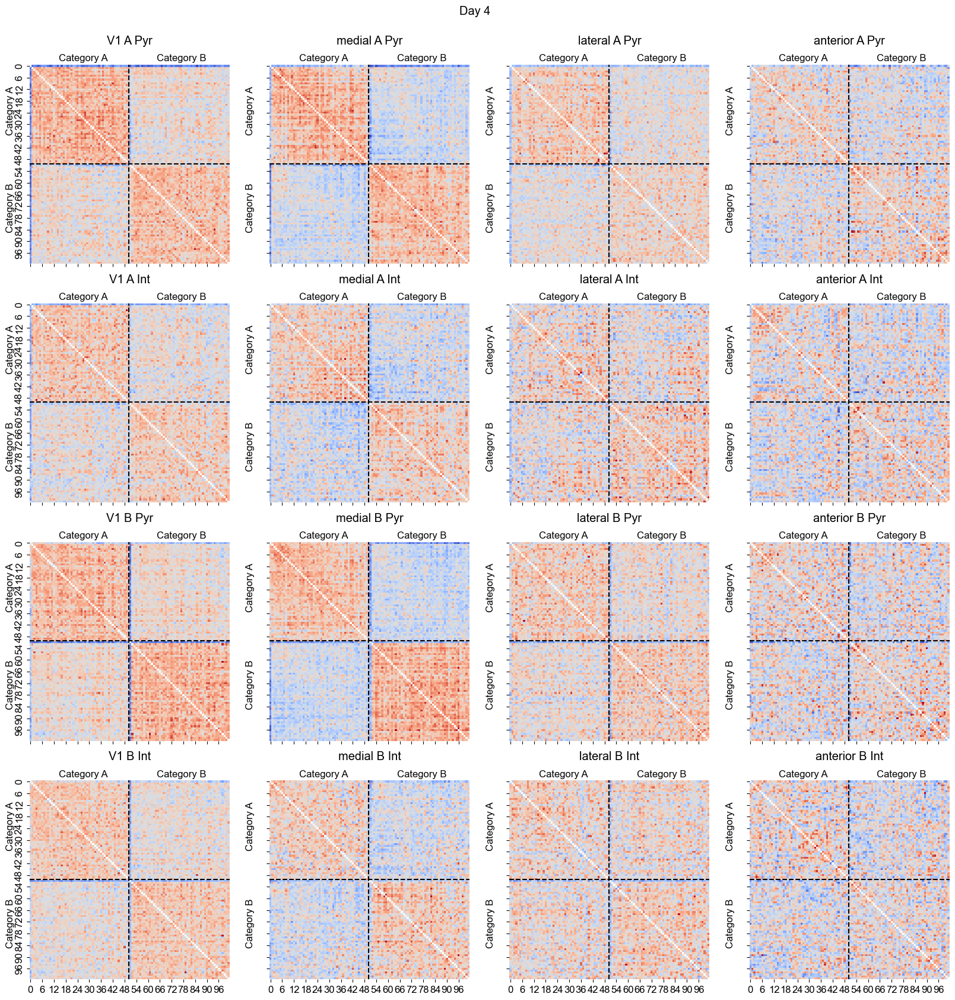

In [435]:
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
sess_days = [first_day, second_day, third_day, fourth_day]
for iday, day in enumerate(sess_days):
    fig, ax = plt.subplots(4,4, figsize=(20,20), sharex=True, sharey=True)
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']): 
        i=0
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)
                plot_sim_matrix(ax[i,ia],representation_matrix)
                ax[i,ia].set_title(f"{area} {category} {celltype}", pad=25, loc='center')
                i+=1
    plt.suptitle(f"Day {iday+1}", y=0.93)
    plt.savefig(Path(f"../data/notz/overall/similarity_matrix_day{iday+1}_neun_0_150.png"))

In [14]:
overall_mtx.shape

(16, 4, 2, 2, 102, 102)

In [15]:
GI_df = pd.DataFrame(columns=['day', 'area', 'category', 'celltype', 'GI', 'intercat'])
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                overall_mtx[iss,ia,ic,icell,:,:]
                cat_A = np.nanmean(overall_mtx[iss,ia,ic,icell, 1:51, 1:51])
                cat_B = np.nanmean(overall_mtx[iss,ia,ic,icell, 52:, 52:])
                intercat = np.nanmean(overall_mtx[iss,ia,ic,icell, 1:51, 52:])
                GI = np.mean([cat_A,cat_B]) - intercat
                if iss in first_day:
                    day = 1
                elif iss in second_day:
                    day = 2
                elif iss in third_day:
                    day = 3
                elif iss in fourth_day:
                    day = 4
                df = pd.DataFrame({'mouse': name, 'date': date, 'day':day, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI , 'intercat': intercat}, index=[0])
                GI_df = pd.concat([GI_df, df], ignore_index=True)

In [16]:
# map values of a column to a different set of values
GI_df['day'] = GI_df['day'].map({1: 'all rewarded before', 2: 'first day of training', 3: 'last day of training', 4: 'all rewarded after'})

In [21]:
GI_df.sort_values(by=['GI']).tail(20)

,day,area,category,celltype,GI,intercat,mouse,date
100,last day of training,medial,A,Pyr,0.269847,-0.112155,VG11,2024_11_14
245,all rewarded after,medial,A,Int,0.271741,-0.112729,VG15,2024_11_01
247,all rewarded after,medial,B,Int,0.281374,-0.085517,VG15,2024_11_01
99,last day of training,V1,B,Int,0.283290,-0.085704,VG11,2024_11_14
96,last day of training,V1,A,Pyr,0.289841,-0.093144,VG11,2024_11_14
230,last day of training,medial,B,Pyr,0.291482,-0.103522,VG15,2024_10_31
101,last day of training,medial,A,Int,0.291893,-0.126151,VG11,2024_11_14
231,last day of training,medial,B,Int,0.303674,-0.113427,VG15,2024_10_31
108,last day of training,anterior,A,Pyr,0.305097,-0.123831,VG11,2024_11_14
239,last day of training,anterior,B,Int,0.330051,-0.152273,VG15,2024_10_31


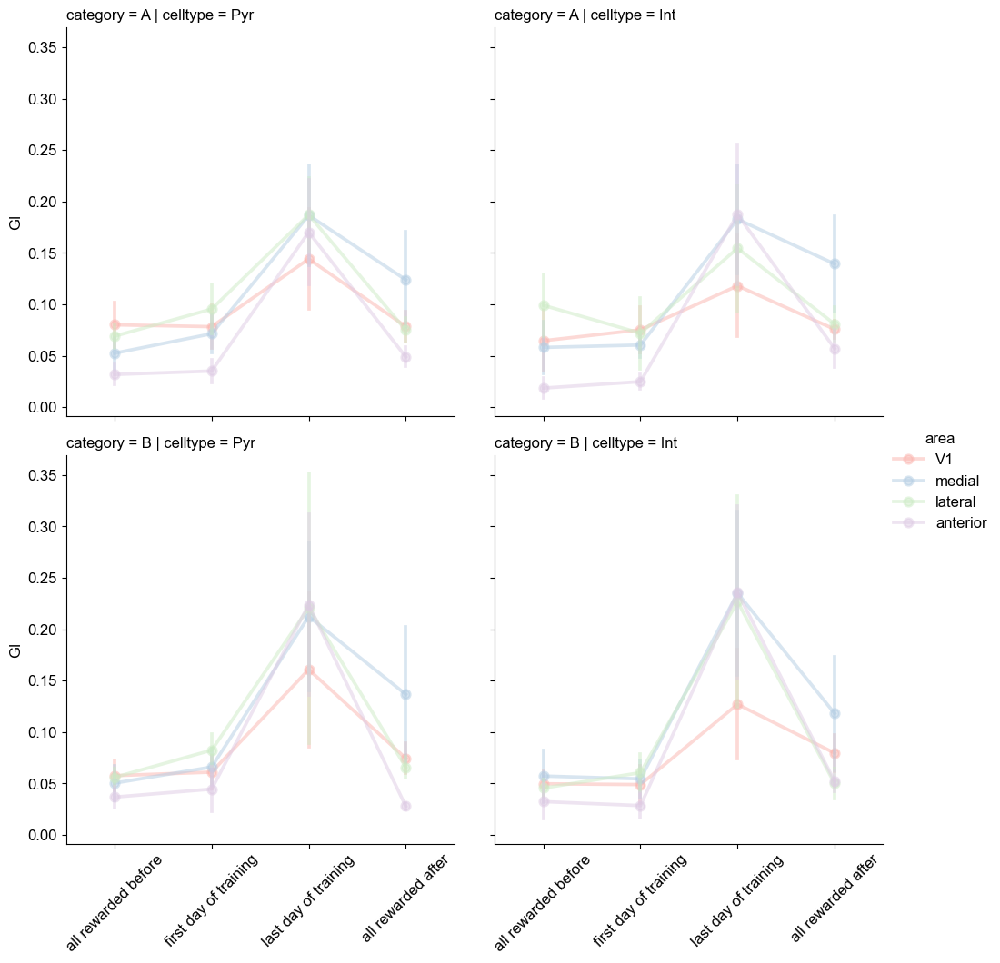

In [28]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='area', row = 'category', col='celltype', kind='point', errorbar='se', 
                estimator='mean', palette='Pastel1', hue_order=['V1', 'medial', 'lateral', 'anterior'], alpha=0.5)
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

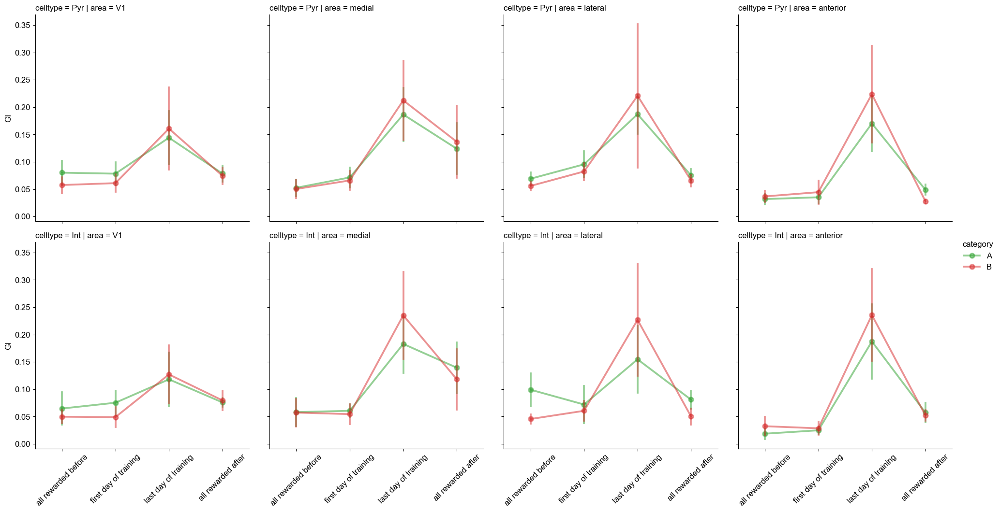

In [29]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='category', row = 'celltype', col='area', kind='point', errorbar='se', palette=['tab:green','tab:red'], hue_order=['A', 'B'], alpha=0.5 )
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

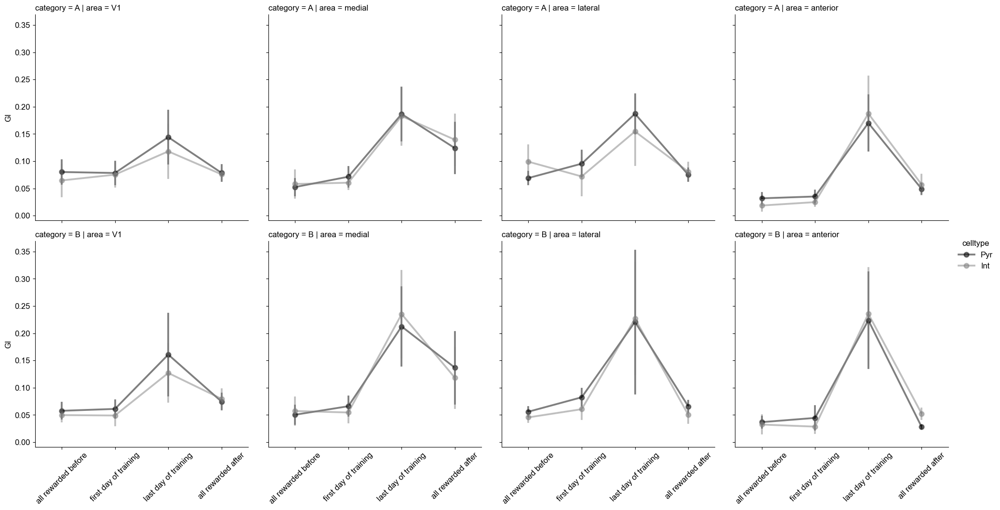

In [30]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='celltype', row = 'category', col='area', kind='point', errorbar='se', palette=['k','gray'], hue_order=['Pyr', 'Int'], alpha=0.5)
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

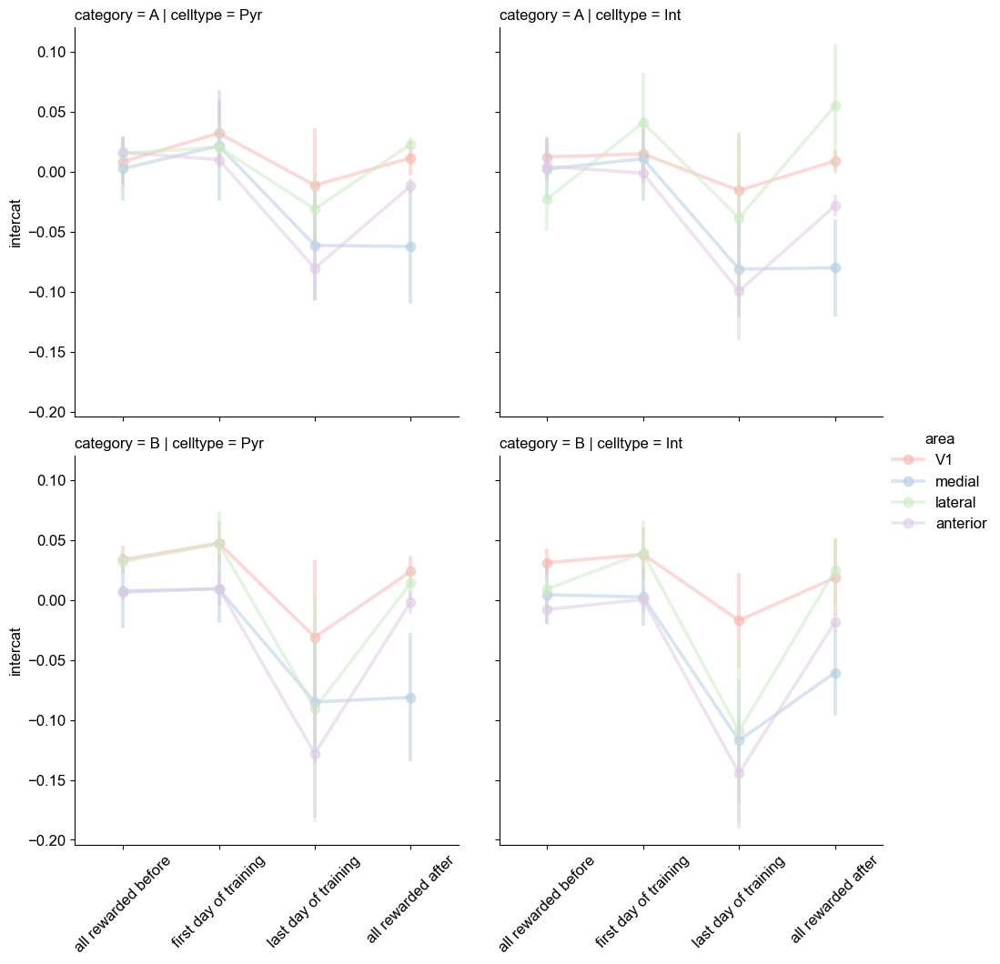

In [445]:
g = sns.catplot(data=GI_df, x='day', y='intercat', hue='area', row = 'category', col='celltype', kind='point', errorbar='se', palette='Pastel1', hue_order=['V1', 'medial', 'lateral', 'anterior'], alpha=0.5)
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')

In [446]:
colors = sns.color_palette("rocket_r", 4)
# Convert the colors to a li
colors_list = list(colors)

C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\1769320686.py:14: RuntimeWarning: Mean of empty slice
  representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)


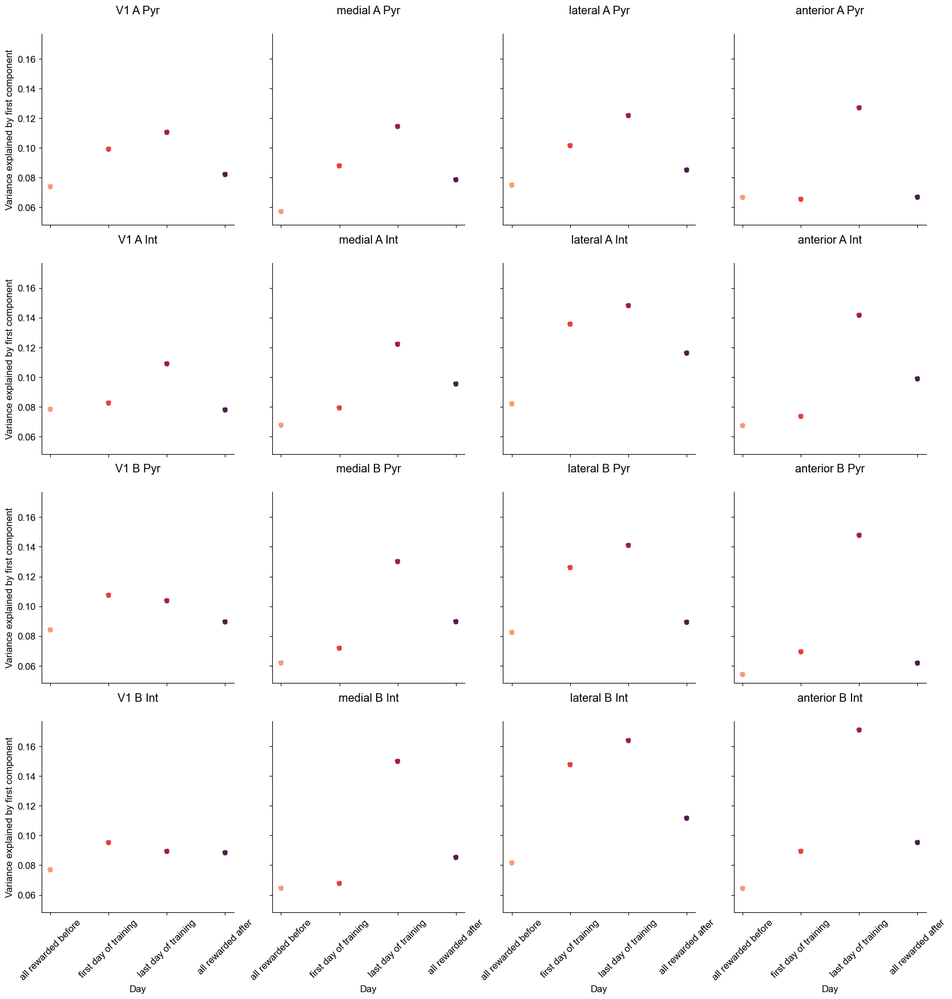

In [447]:
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
sess_days = [first_day, second_day, third_day, fourth_day]
fig, ax = plt.subplots(4,4, figsize=(20,20), sharex=True, sharey=True)
for iday, day in enumerate(sess_days):
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']):
        ax[3,ia].set_xlabel('Day')
        ax[3,ia].set_xticks([0,1,2,3], ['all rewarded before', 'first day of training', 'last day of training', 'all rewarded after'], rotation=45)
        i=0
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)
                np.fill_diagonal(representation_matrix, 1)
                U, s, V = np.linalg.svd(representation_matrix)
                variance_explained_first = s / np.sum(s)
                variance_explained_first = variance_explained_first[0]
                ax[i,ia].scatter(iday, variance_explained_first, linestyle='--', label={iday+1}, color=colors_list[iday])
                #ax[i,ia].loglog(np.arange(1,102),s[:-1], linestyle='--', label={iday+1}, color=colors_list[iday])
                ax[i,ia].set_title(f"{area} {category} {celltype}", pad=25, loc='center')
                ax[i,0].set_ylabel('Variance explained by first component')
                i+=1

# response quantifications

In [427]:
df_quantification = pd.DataFrame(columns=['mouse', 'date', 'blk','day', 'area', 'selective_to', 'response_to', 
                                          'celltype','max_response', 'min_response', 'peak_pos', 'max_pos',
                                          'min_pos', 'avg_on_contrast', 'avg_first_half', 'avg_second_half', 'avg_gray',
                                          'slope_first_half', 'slope_second_half', 'biggest_change', 'no_peaks_half_max', 'no_peaks_half_min'])
from scipy.signal import find_peaks
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    m = utils.load_mouse(name, date, blk, load_neurons=True, interp_behav=True, load_retinotopy=True, mdl_path=r"D:\mouseobj\notz")
    m.interp_spks = m.interp_spks - m.interp_spks.mean(1, keepdims=True)
    id_responses = get_istim_matrix(m)
    utils.compute_dprime(m, discrimination_region=(25,275), concatenate=False, remove_mean=False)
    for area in ['V1', 'medial', 'lateral', 'anterior']:
        for category in ['A', 'B']:
            for celltype in ['Pyr', 'Int']:
                selection, _ = filter_neurons_v2(m, area, category, celltype=celltype)
                main_dir = Path(f"../data/notz/{name}/{date}/{blk}/{area}/{category}/{celltype}")
                if not main_dir.exists():
                    main_dir.mkdir(parents=True)
                for ir, response_to in enumerate(['A', 'B']):
                        pop = id_responses[selection].mean(0) #avg over neurons
                        pop = pop[ir,1:] # selection of category and rest of instances
                        pop = np.nanmean(pop, axis=0) # avg over instances
                        maxi = np.max(pop)
                        mini = np.min(pop)
                        peak = np.argmax(np.abs(pop))
                        argmax = np.argmax(pop)
                        argmin = np.argmin(pop)
                        no_peaks_half_max = len(find_peaks(pop, height=np.max(pop)*0.5)[0])
                        no_peaks_half_min = len(find_peaks(pop, height=np.min(pop)*0.5)[0])
                        avg_on_contrast = pop[25:275].mean()
                        avg_first_half = pop[0:150].mean()
                        avg_second_half = pop[150:300].mean()
                        avg_gray = pop[300:400].mean()
                        first_200 = pop[0:150]
                        second_200 = pop[150:300]
                        slope_first_half = (first_200[-1] - first_200[0]) / (len(first_200) - 1)
                        slope_second_half = (second_200[-1] - second_200[0]) / (len(second_200) - 1)
                        biggest_change = np.argmax(np.abs(np.diff(pop)))
                        if iss in first_day:
                            day = 1
                        elif iss in second_day:
                            day = 2
                        elif iss in third_day:
                            day = 3
                        elif iss in fourth_day:
                            day = 4
                        df_quantification = df_quantification.append({'mouse': name, 
                                                                      'date': date,
                                                                      'blk':blk,
                                                                      'day':day, 
                                                                      'area': area, 
                                                                      'selective_to': category, 
                                                                      'response_to': response_to,
                                                                      'celltype': celltype,
                                                                      'max_response': maxi, 
                                                                      'min_response': mini, 
                                                                      'peak_pos': peak,
                                                                      'max_pos': argmax,
                                                                      'min_pos': argmin, 
                                                                      'avg_on_contrast': avg_on_contrast, 
                                                                      'avg_first_half': avg_first_half, 
                                                                      'avg_second_half': avg_second_half, 
                                                                      'avg_gray': avg_gray,
                                                                      'slope_first_half': slope_first_half,
                                                                      'slope_second_half': slope_second_half,
                                                                      'biggest_change': biggest_change,
                                                                      'no_peaks_half_max': no_peaks_half_max,
                                                                      'no_peaks_half_min': no_peaks_half_min}, ignore_index=True)
df_quantification.to_csv(Path(f"../data/notz/quantification.csv"))

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_10_15\4
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(25932, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(29324, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_10_31\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(29842, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_11_01\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(19578, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_11_04\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(23124, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_11_05\3
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(24045, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_11_14\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(22558, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG11\2024_11_15\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(24964, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG14\2024_10_15\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(27048, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG14\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(31829, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG14\2024_11_21\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(29439, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG14\2024_11_23\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(26262, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG15\2024_10_15\3
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(35094, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG15\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(30110, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG15\2024_10_31\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(22309, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Checking if model object exists ...
Loading mouse object from D:\mouseobj\notz\VG15\2024_11_01\3
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
*************************************
Mouse object loaded from local path
(20669, 2, 51, 400)
dprime saved in MouseObject.train_dp (neurons) using even trials


C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_quantification = df_quantification.append({'mouse': name,
C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\963947396.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

# computing the representation matrices using csig instead of dprime

In [550]:
def sig_variance(m, cat='A', corridor=(0,125), onlytrain=True):
    from scipy.stats import zscore
    # this function computers signal variance based on repeated presentations of the same stimuli
    # if you have more than two repeats, this can take advantage of that (equivalent to forming all pairs of repeats)

    # resp = (neurons, #stimuli)
    # stimid = (#stimuli)

    # example cc = sig_variance(resp, stimid)
    colapsed = m.frameselector.assign(category = m.frameselector["trial_type"].map({"rewarded": "A", "non rewarded": "B", "rewarded test": "A", "non rewarded test": "B"}))
    R = m.interp_spks[:,:,corridor[0]:corridor[1]].mean(-1)
    NN = m.interp_spks.shape[0] 
    if onlytrain:
        iss = colapsed.query(f"category == '{cat}' & istim == 1").trial_no.unique().astype(int) -1
    else:
        iss = colapsed.query(f"category == '{cat}'").trial_no.unique().astype(int) -1
    h1 = R[:,iss[::2]] + np.finfo(np.float64).tiny
    h2 = R[:,iss[1::2]] + np.finfo(np.float64).tiny
    reps_1 = len(iss[::2])
    reps_2 = len(iss[1::2])
    if reps_1 > reps_2:
        h1 = h1[:,:reps_2]
    elif reps_1 < reps_2:
        h2 = h2[:,:reps_1]
    cc = np.array([np.corrcoef(h1[i], h2[i])[0,1] for i in range(NN)])
    nanidx = np.isnan(cc)
    cc[nanidx] = 0
    return cc

In [551]:
cc = sig_variance(m, cat='A', corridor=(0,150), onlytrain=True)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [570]:
from itertools import combinations
for sess in all_sessions:
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    m = utils.load_mouse(name, date, blk, load_neurons=True, interp_behav=True, load_retinotopy=True, mdl_path=r"D:\mouseobj")
    #m.interp_spks = m.interp_spks - m.interp_spks.mean(1, keepdims=True)
    id_responses = get_istim_matrix(m)
    for area in ['V1', 'medial', 'lateral', 'anterior']:
        for category in ['A', 'B']:
            for celltype in ['Pyr', 'Int']:
                main_dir = Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}")
                if not main_dir.exists():
                    main_dir.mkdir(parents=True)
                cc_sel = sig_variance(m, cat=category, corridor=(0,300), onlytrain=True) > .1
                a_sel = utils.get_region_idx(m.iarea, area)
                if celltype == "Pyr":
                    selected_type = np.logical_not(m.isred[:,0]).astype(bool)
                elif celltype == "Int":
                    selected_type = m.isred[:,0].astype(bool)
                selection = cc_sel * a_sel * selected_type
                nneurons = id_responses.shape[0]
                id_resp_idx = id_responses.reshape(nneurons, 102, 400)
                representation_matrix = np.ones((102,102)) * np.nan
                pairs = list(combinations(np.arange(102),2))
                id_area = id_resp_idx[selection,:,0:125].mean(2)
                for pair in pairs:
                    instance_a = id_area[:,pair[0]]
                    instance_b = id_area[:,pair[1]]
                    corr = np.corrcoef(instance_a, instance_b)[0,1]
                    representation_matrix[pair[0],pair[1]] = corr
                    representation_matrix[pair[1],pair[0]] = corr
                fig, ax = plt.subplots(1,1, figsize=(9,6))
                plot_sim_matrix(ax, representation_matrix)
                plt.suptitle(f"{area} {category} {celltype}")
                plt.savefig(Path(f"{main_dir}/similarity_matrix_neun_0_300_cc_onlytrain.png"))
                plt.close()
                np.save(Path(f"{main_dir}/representation_matrix_neun_0_300_cc_onlytrain.npy"), representation_matrix)

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_10_15\4
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(25932, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(29324, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_10_31\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(29842, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_11_01\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(19578, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_11_04\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(23124, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_11_05\3
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(24045, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_11_14\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(22558, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG11\2024_11_15\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(24964, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG14\2024_10_15\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(27048, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG14\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(31829, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG14\2024_11_21\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(29439, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG14\2024_11_23\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(26262, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG15\2024_10_15\3
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(35094, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG15\2024_10_16\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(30110, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG15\2024_10_31\2
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(22309, 2, 51, 400)


c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\labadmin\anaconda3\envs\categoryneural\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value e

Checking if model object exists ...
Loading mouse object from D:\mouseobj\VG15\2024_11_01\3
Existing mouse object has the following attributes:
dict_keys(['name', 'datexp', 'blk', 'data_path', '_timeline', '_data_var', '_settings', '_timestamps', '_trial_info', '_spks', '_ypos', '_xpos', '_iplane', '_stat', '_ops', '_snr', 'xy_t', 'iarea', 'iregion', 'outline', 'frameselector', 'isred', 'interp_spks', 'trial_dict', 'train_dp'])
(20669, 2, 51, 400)


In [571]:
from pathlib import Path
overall_mtx = np.empty((16,4,2,2,102,102))
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.load(Path(f"../data/{name}/{date}/{blk}/{area}/{category}/{celltype}/representation_matrix_neun_0_300_cc_onlytrain.npy"))
                overall_mtx[iss,ia,ic,icell,:,:] = representation_matrix
np.save(Path(f"../data/overall/representation_matrix_neun_0_300_cc_onlytrain.npy"), overall_mtx)

In [572]:
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
sess_days = [first_day, second_day, third_day, fourth_day]
for iday, day in enumerate(sess_days):
    fig, ax = plt.subplots(4,4, figsize=(20,20), sharex=True, sharey=True)
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']): 
        i=0
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)
                plot_sim_matrix(ax[i,ia],representation_matrix)
                ax[i,ia].set_title(f"{area} {category} {celltype}", pad=25, loc='center')
                i+=1
    plt.suptitle(f"Day {iday+1}", y=0.93)
    plt.savefig(Path(f"../data/overall/similarity_matrix_day{iday+1}_neun_0_300_cc_onlytrain.png"))
    plt.close()

C:\Users\labadmin\AppData\Local\Temp\ipykernel_29400\2662848610.py:12: RuntimeWarning: Mean of empty slice
  representation_matrix = np.nanmean(overall_mtx[day,ia,ic,icell,:,:], axis=0)


In [573]:
GI_df = pd.DataFrame(columns=['day', 'area', 'category', 'celltype', 'GI', 'intercat'])
first_day = np.arange(0,16,4)
second_day = np.arange(1,16,4)
third_day = np.arange(2,16,4)
fourth_day = np.arange(3,16,4)
for iss, sess in enumerate(all_sessions):
    name = sess['mname']
    date = sess['datexp']
    blk = sess['blk']
    for ia, area in enumerate(['V1', 'medial', 'lateral', 'anterior']):
        for ic, category in enumerate(['A', 'B']):
            for icell, celltype in enumerate(['Pyr', 'Int']):
                overall_mtx[iss,ia,ic,icell,:,:]
                cat_A = np.nanmean(overall_mtx[iss,ia,ic,icell, :51, :51])
                cat_B = np.nanmean(overall_mtx[iss,ia,ic,icell, 51:, 51:])
                intercat = np.mean(overall_mtx[iss,ia,ic,icell, :51, 51:])
                GI = np.mean([cat_A,cat_B]) - intercat
                if iss in first_day:
                    day = 1
                elif iss in second_day:
                    day = 2
                elif iss in third_day:
                    day = 3
                elif iss in fourth_day:
                    day = 4
                df = pd.DataFrame({'mouse': name, 'date': date, 'day':day, 'area': area, 'category': category, 'celltype': celltype, 'GI': GI , 'intercat': intercat}, index=[0])
                GI_df = pd.concat([GI_df, df], ignore_index=True)
GI_df['day'] = GI_df['day'].map({1: 'all rewarded before', 2: 'first day of training', 3: 'last day of training', 4: 'all rewarded after'})                

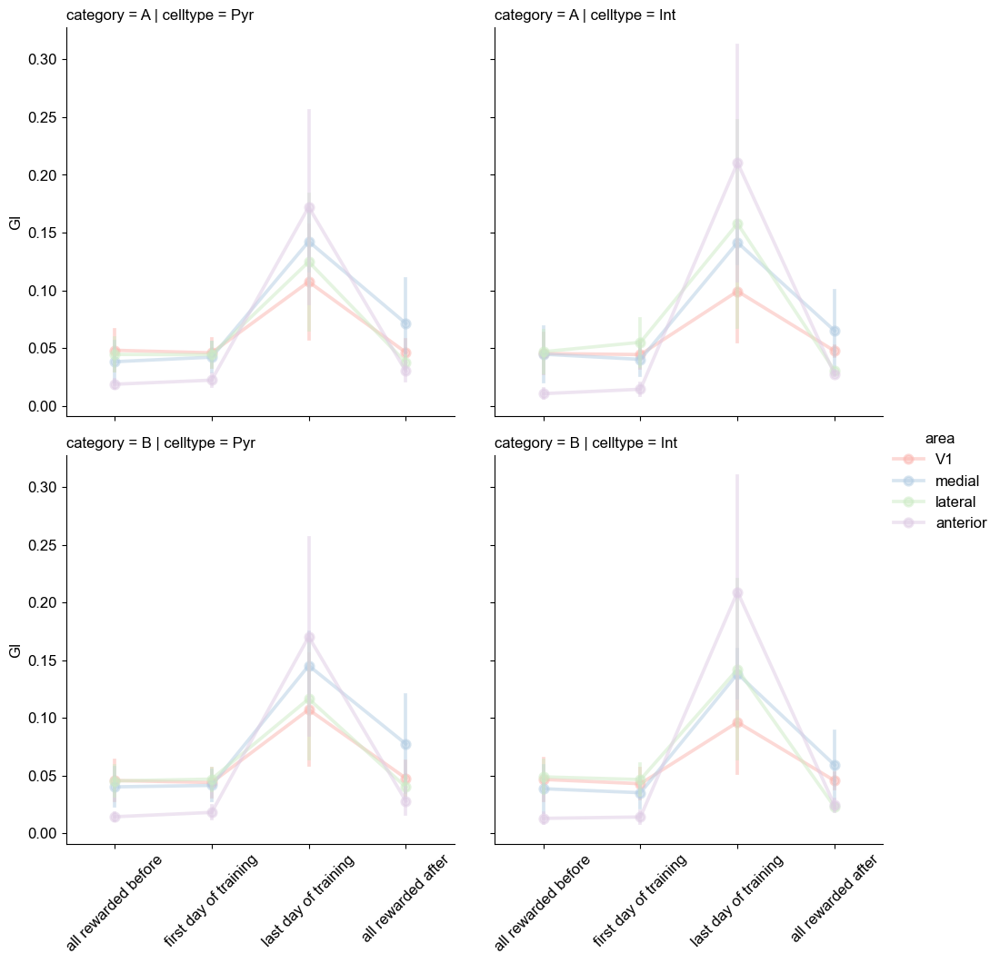

In [574]:
g = sns.catplot(data=GI_df, x='day', y='GI', hue='area', row = 'category', col='celltype', kind='point', errorbar='se', palette='Pastel1', hue_order=['V1', 'medial', 'lateral', 'anterior'], alpha=0.5)
# rotate x-axis labels
g.set_xticklabels(rotation=45)
g.set_xlabels('')